In [1]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [2]:
# load ylov8 object detection model from ultralytics
!pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.0 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 36.5/112.6 GB disk)


In [3]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="9JqwW7ycmwhuRCaBCkkP")

project = rf.workspace("tasarimproject").project("car-space-find")
dataset = project.version(2).download("yolov8")

/content/datasets
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 2.3 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.3.0, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Car-Space-Find-2 in yolov8:: 100%|██████████| 3052/3052 [00:01<00:00, 1933.45it/s]


In [4]:
dataset.location

'/content/datasets/Car-Space-Find-2'

In [9]:
#tarain model on the dataset with CLI
%cd {HOME}
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=9 imgsz=800 plots=True

/content
Ultralytics 8.3.0 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Car-Space-Find-2/data.yaml, epochs=9, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, 

In [6]:
from ultralytics import YOLO
from IPython.display import display, Image

In [21]:
#function for drawing on each frame of the video
import cv2
def draw_result(frame, frame_height):
    model = YOLO('/content/runs/detect/train2/weights/best.pt')
    results = model.predict(frame, conf=0.25)

    for result in results:
        for box in result.boxes:
            # Extract box coordinates
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Convert coordinates to integers
            # Draw rectangle around the detected object

            empty = 0
            occupied = 0

            if box.cls[0] == 0:
                empty += 1
                cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0),2)
                cv2.putText(frame, 'Empty', (x1, y1), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255),2)
                cv2.putText(frame, f'empty :{empty}', (0, 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5,(0, 0, 0),2)

            elif box.cls[0] == 1:
                occupied += 1
                cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 0, 255), 2)
                cv2.putText(frame, 'Occupied', (x1, y1), cv2.FONT_HERSHEY_SIMPLEX, 0.5,(0, 0, 0),2)
                cv2.putText(frame, f'occupied :{occupied}', (0, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5,(0, 0, 0),2)

    return frame


0: 384x800 10 emptys, 4 occupieds, 14.1ms
Speed: 3.3ms preprocess, 14.1ms inference, 6.4ms postprocess per image at shape (1, 3, 384, 800)


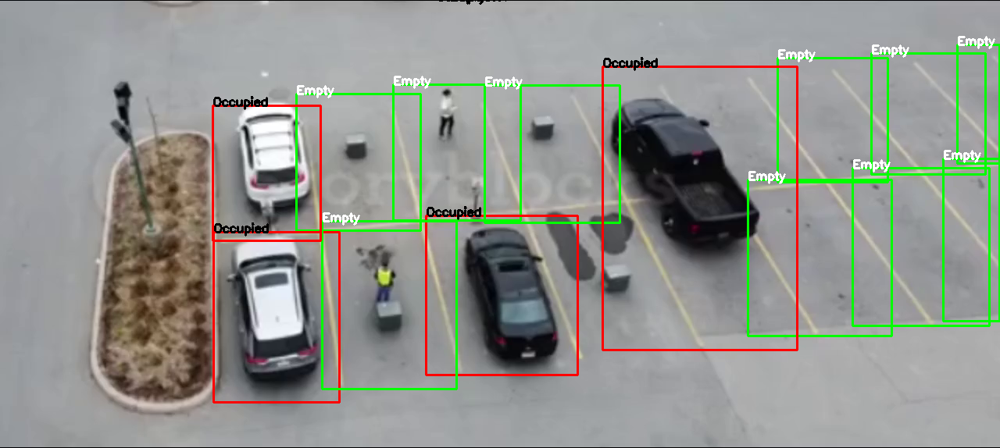


0: 384x800 10 emptys, 4 occupieds, 13.6ms
Speed: 2.1ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 800)


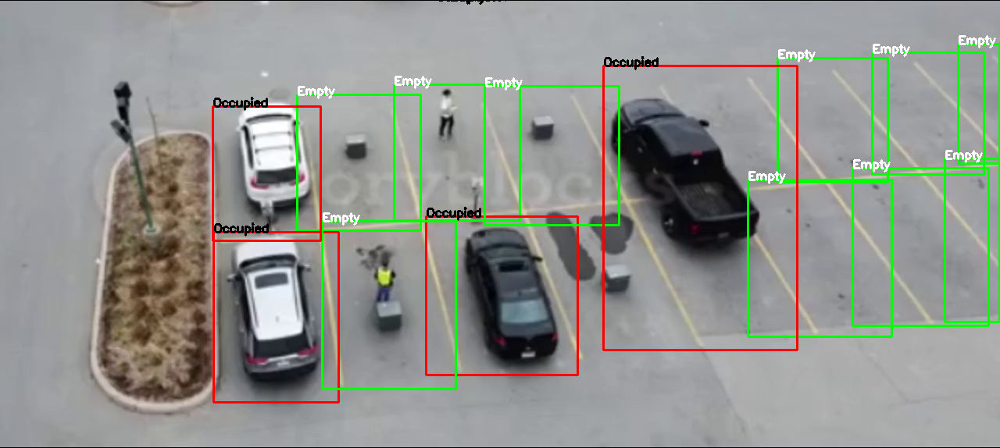


0: 384x800 10 emptys, 4 occupieds, 13.5ms
Speed: 3.2ms preprocess, 13.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 800)


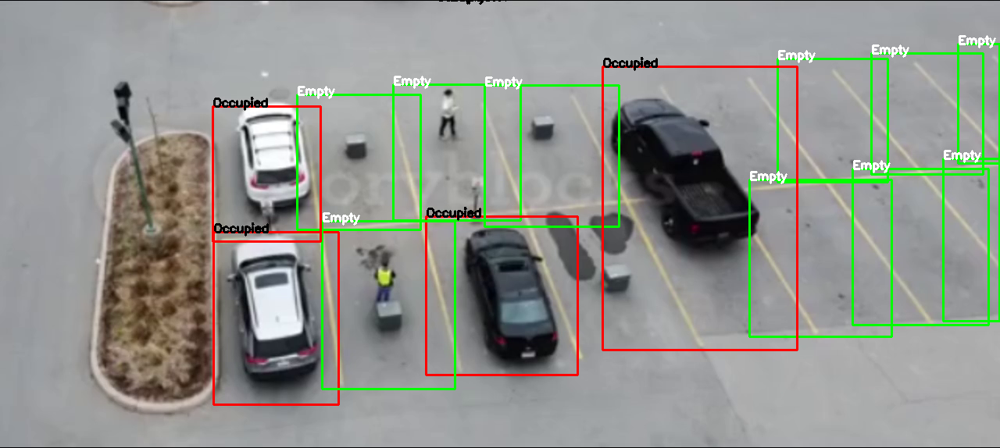


0: 384x800 10 emptys, 4 occupieds, 14.4ms
Speed: 5.7ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 800)


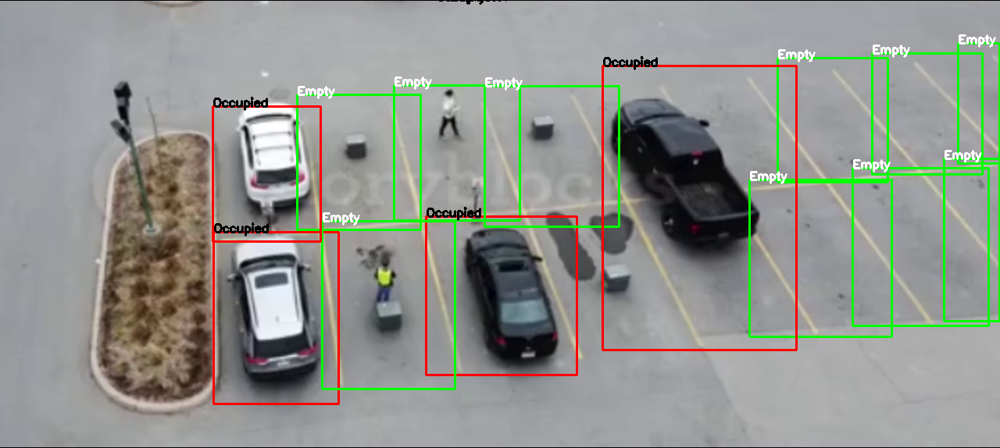


0: 384x800 10 emptys, 4 occupieds, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 800)


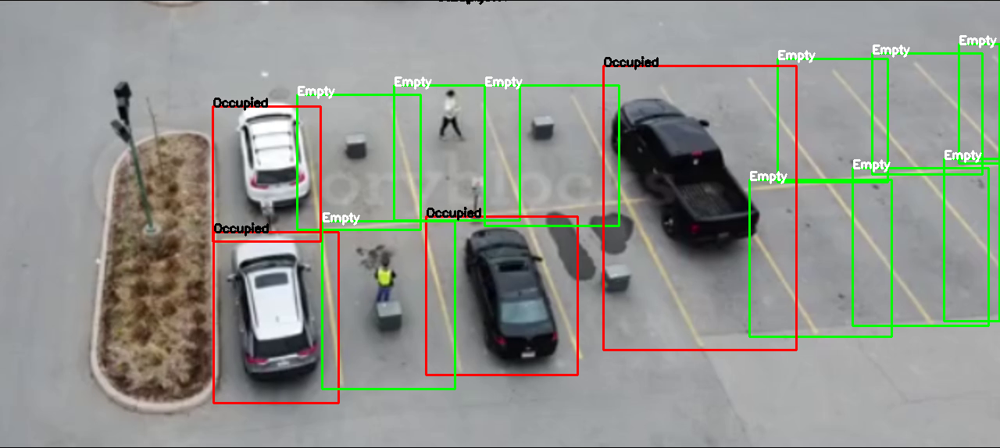


0: 384x800 10 emptys, 4 occupieds, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 800)


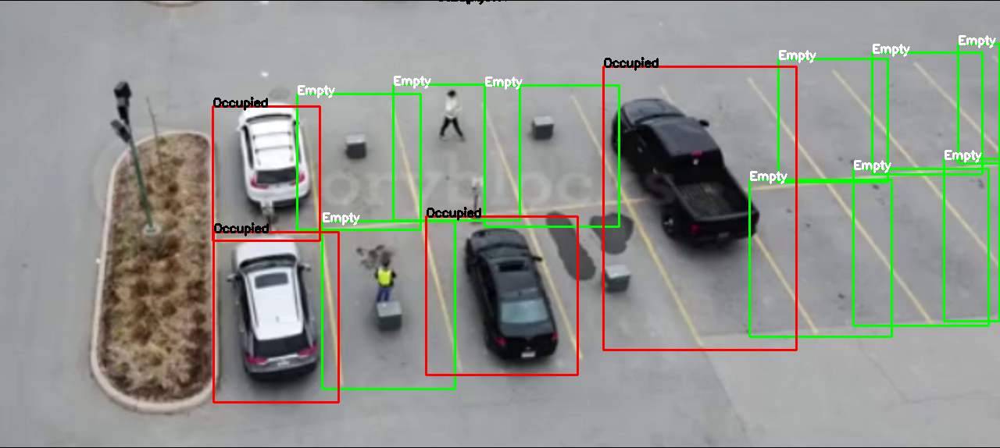


0: 384x800 10 emptys, 4 occupieds, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 800)


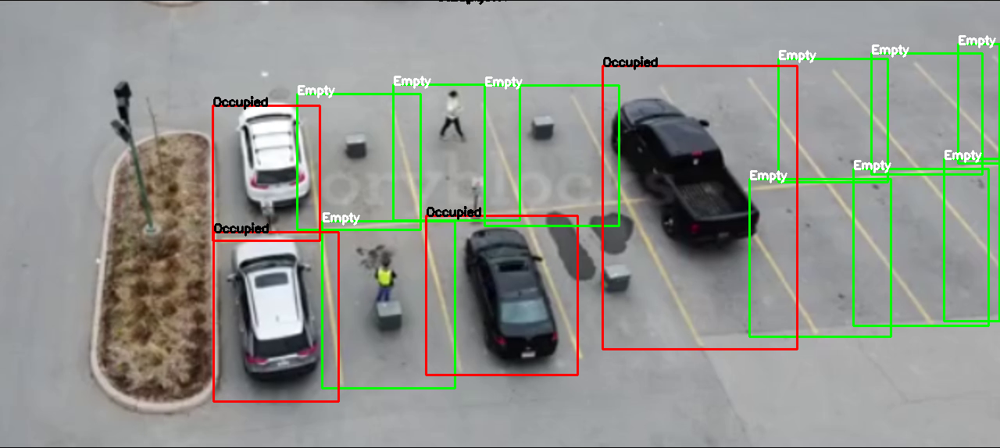


0: 384x800 10 emptys, 4 occupieds, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 800)


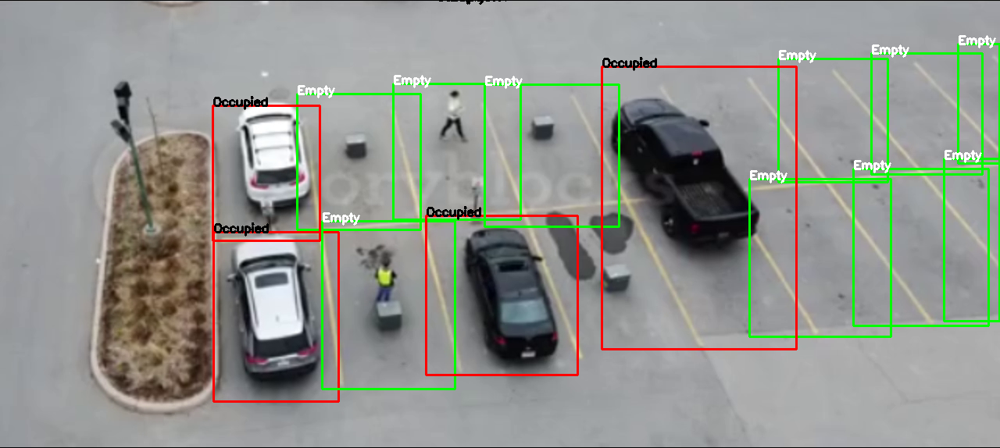


0: 384x800 10 emptys, 4 occupieds, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 800)


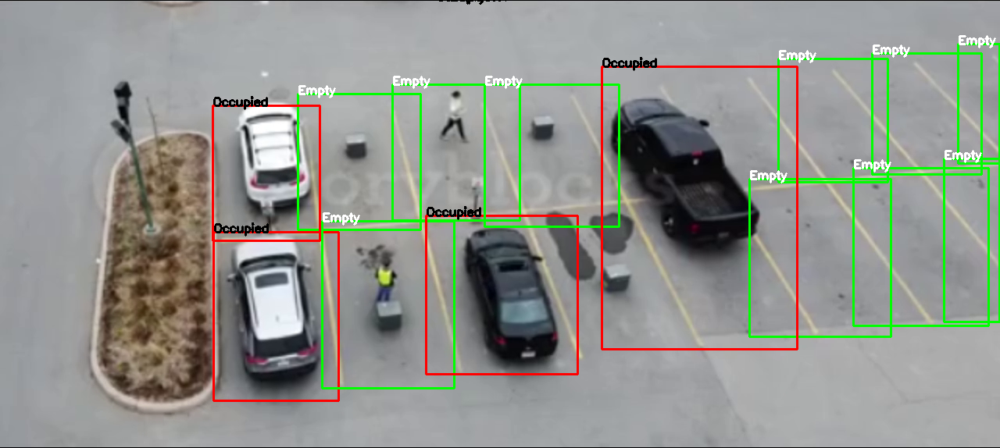


0: 384x800 10 emptys, 4 occupieds, 13.6ms
Speed: 3.6ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 800)


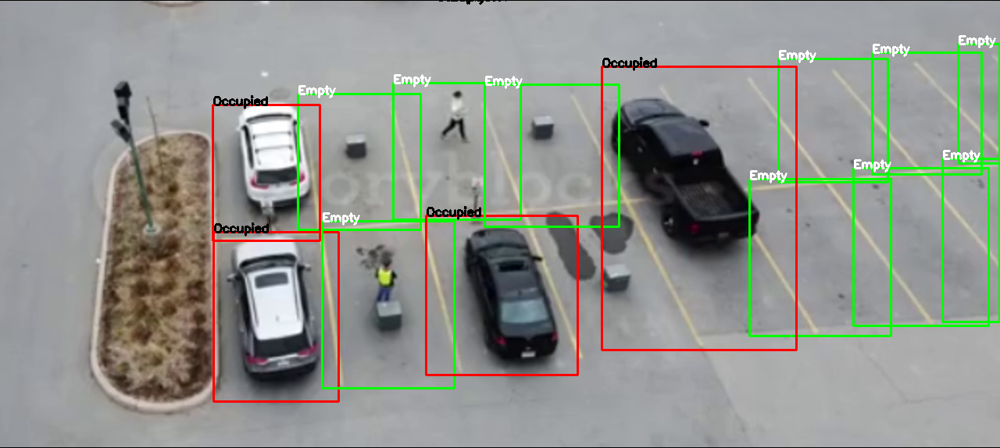


0: 384x800 10 emptys, 4 occupieds, 13.7ms
Speed: 3.9ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 800)


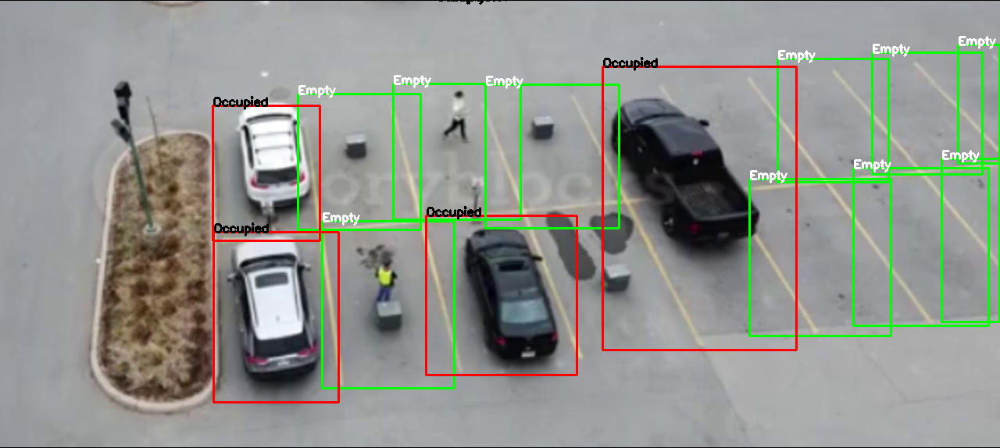


0: 384x800 10 emptys, 4 occupieds, 13.8ms
Speed: 5.3ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 800)


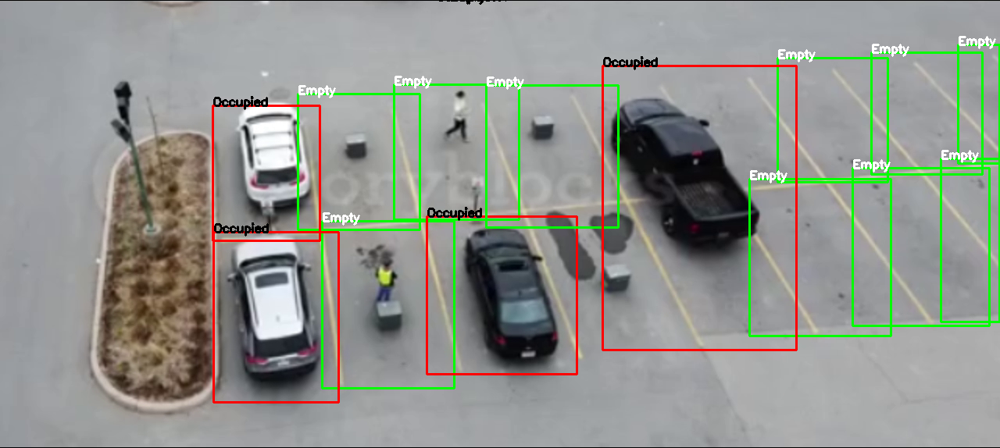


0: 384x800 10 emptys, 4 occupieds, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 800)


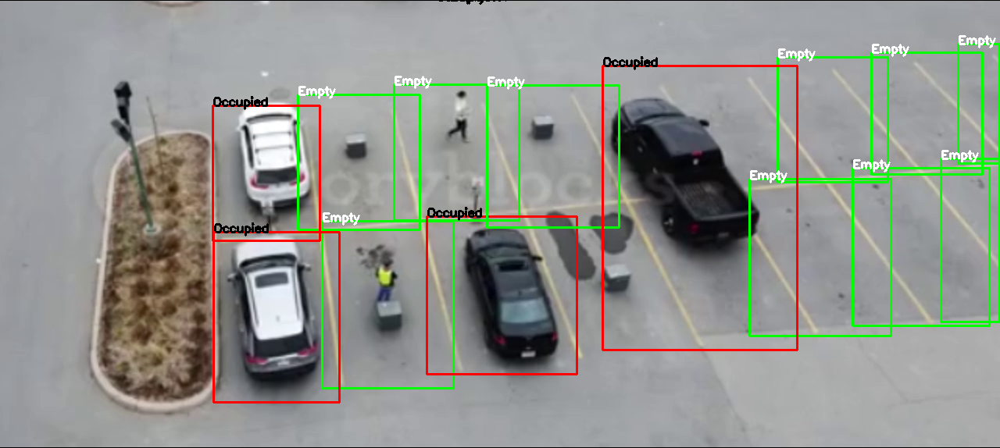


0: 384x800 10 emptys, 4 occupieds, 13.7ms
Speed: 4.2ms preprocess, 13.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 800)


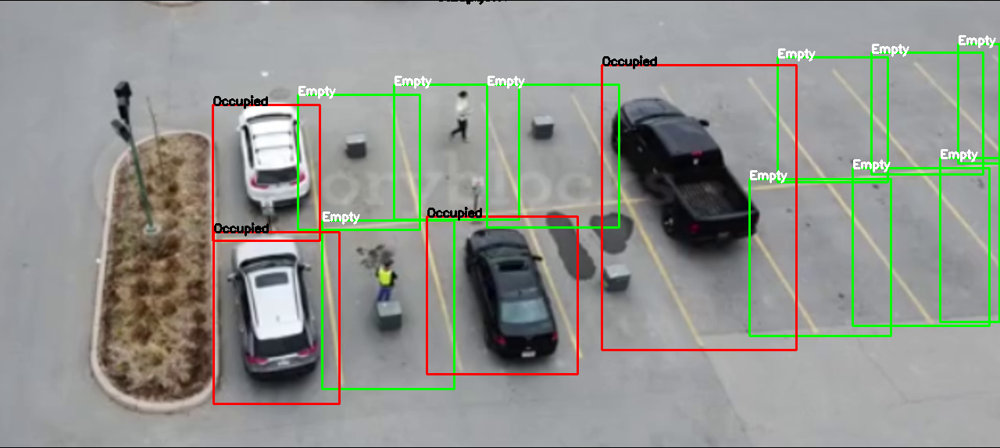


0: 384x800 10 emptys, 4 occupieds, 15.3ms
Speed: 6.5ms preprocess, 15.3ms inference, 4.2ms postprocess per image at shape (1, 3, 384, 800)


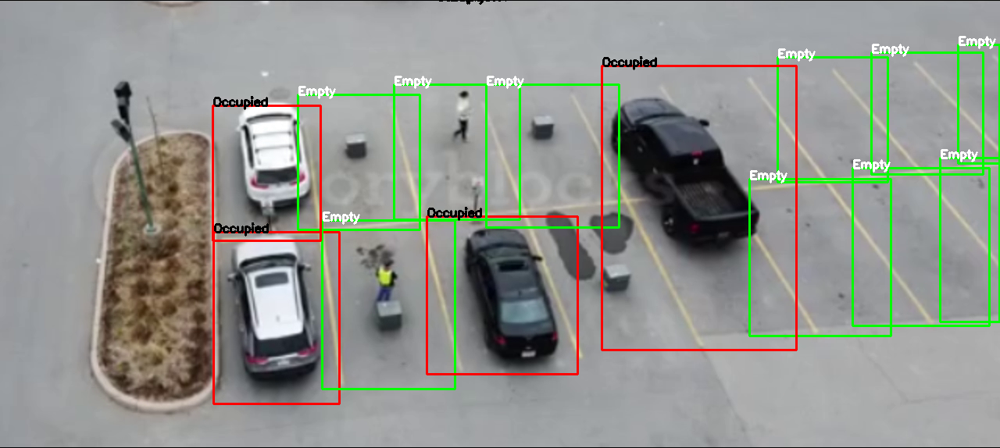


0: 384x800 10 emptys, 4 occupieds, 13.6ms


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO

video_path = '/content/InShot_20240930_182124728.mp4'

cap = cv2.VideoCapture(video_path)

# Check if video opened successfully

# Get frame width and height from the video
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)  # Optional, to maintain the original frame rate

# Define the codec and create VideoWriter object with correct frame size
fourcc = cv2.VideoWriter_fourcc(*'MJPG')
out = cv2.VideoWriter('output.mp4', fourcc, fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()

    # Break the loop if the end of the video is reached
    if not ret:
        break

    # Process the frame
    frame = draw_result(frame, frame_height)  # Ensure draw_result function works properly
    cv2_imshow(frame)

    # Write the processed frame to the output video
    out.write(frame)

# Release everything if the job is finished
cap.release()
out.release()
cv2.destroyAllWindows()